# Feature extraction for segmented nuclei in 3D

This notebook serves as a sandbox to develop a feature extraction pipeline for segmented immunofluorescent images.

## 0. Environmental setup


In [1]:
from typing import List
from skimage import measure, segmentation, filters, morphology, color, feature, exposure
import numpy as np
import pandas as pd
import random
import sys
import tifffile
import scipy.ndimage as ndi
import cv2
from tqdm import tqdm_notebook
import os
from joblib import Parallel, delayed

sys.path.insert(1, "..")

from src.utils.io import get_file_list
from src.utils.visualization import plot_3d_images_as_map, explore_slices_multichannel
from src.utils.visualization import explore_slices, explore_slices_2_samples
from src.utils.visualization import explore_slices_2_samples_multichannel, color_3d_segmentations

import matplotlib.pyplot as plt

seed = 1234
random.seed(seed)
np.random.seed(seed)

In [2]:
from ncmo.src.utils.Run_nuclear_feature_extraction import run_nuclear_chromatin_feat_ext

---

## 1. Read in data

We will now read in the data. Therefore we expect 2D max-z projected images to be available for the DAPI channel as well as their respective segmentation masks. This data is used for the derivation of 2D features for the individual nuclei.

Additionally, we will load 3D multichannel images of the individual nuclei. This data will be used for the extraction of image features in 3D.

In [9]:
dapi_images_projections_dir = "../data/condition_media/hmf3a_09_04_2021/condition_media/dapi_hp1_actin/segmented/concomp_2d/dapi_projections_2d"
segmented_projections_dir = "../data/condition_media/hmf3a_09_04_2021/condition_media/dapi_hp1_actin/segmented/concomp_2d/labeled_segmentation_2d"
segmented_nuclei_dir = "../data/condition_media/hmf3a_09_04_2021/condition_media/dapi_hp1_actin/segmented/concomp_2d/nuclear_crops_3d"

In [6]:
dapi_images_proj_locs = get_file_list(dapi_images_projections_dir)
dapi_image_projs = []
for loc in dapi_images_proj_locs:
    dapi_image_projs.append(tifffile.imread(loc))

In [7]:
segmented_proj_locs = get_file_list(segmented_projections_dir)
segmented_projs = []
for loc in segmented_proj_locs:
    segmented_projs.append(tifffile.imread(loc))

In [10]:
segmented_nuclei_locs = get_file_list(segmented_nuclei_dir)
segmented_nuclei = []
for loc in segmented_nuclei_locs:
    segmented_nuclei.append(tifffile.imread(loc))

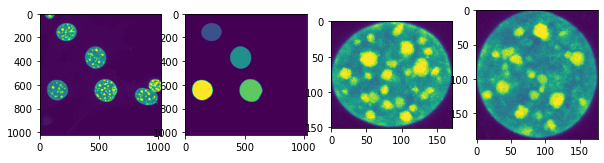

In [11]:
fig, ax = plt.subplots(1,4, figsize=[10,8])
ax[0].imshow(dapi_image_projs[0])
ax[1].imshow(segmented_projs[0])
ax[2].imshow(segmented_nuclei[0][:,0,:,:].max(axis=0))
ax[3].imshow(segmented_nuclei[1][:,0,:,:].max(axis=0))

In [12]:
explore_slices_2_samples_multichannel(segmented_nuclei, cmap="seismic")

interactive(children=(IntSlider(value=8, description='plane', max=33), IntSlider(value=0, description='channel…

<function src.utils.visualization.explore_slices_2_samples_multichannel.<locals>.display_slice(plane=8, channel=0)>

In [87]:
i=1
z_dapi_proj = segmented_nuclei[i][:,0,:,:].max(axis=0)
nucleus_mask = z_dapi_proj > filters.threshold_otsu(z_dapi_proj)
nucleus_mask = ndi.binary_fill_holes(nucleus_mask)

hc_mask_true = segmented_nuclei[i][:,1,:,:].max(axis=0)

hc_mask_pred = z_dapi_proj > (z_dapi_proj[nucleus_mask].mean() + 1.0 * z_dapi_proj[nucleus_mask].std())


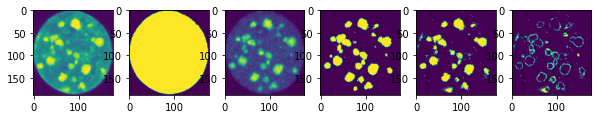

In [88]:
fig, ax = plt.subplots(1,6, figsize=[10,8])
ax[0].imshow(z_dapi_proj)
ax[1].imshow(nucleus_mask)
ax[2].imshow(hc_mask_true)
ax[3].imshow(hc_mask_true > filters.threshold_otsu(hc_mask_true))
ax[4].imshow(hc_mask_pred)
ax[5].imshow(np.abs(np.logical_xor(hc_mask_pred,(hc_mask_true > filters.threshold_otsu(hc_mask_true)))))

---

## 2. Feature extraction

After reading in the data we will now extract the morphological and chromatin features.

### 2a. Features from DAPI in 2D

In [11]:
features = run_nuclear_chromatin_feat_ext(dapi_images_proj_locs[0], segmented_proj_locs[0], 'temp/')

  0%|          | 0/7 [00:00<?, ?it/s]

In [12]:
list(features.columns)

['Avg_Curvature',
 'Std_Curvature',
 'nPolarity_changes',
 'Max_posi_Curvature',
 'Avg_posi_Curvature',
 'Med_posi_Curvature',
 'Std_posi_Curvature',
 'Sum_posi_Curvature',
 'Len_posi_Curvature',
 'Max_neg_Curvature',
 'Avg_neg_Curvature',
 'Med_neg_Curvature',
 'Std_neg_Curvature',
 'Sum_neg_Curvature',
 'Len_neg_Curvature',
 'num_prominant_positive_curvature',
 'prominance_prominant_positive_curvature',
 'width_prominant_positive_curvature',
 'prominant_positive_curvature',
 'num_prominant_negative_curvature',
 'prominance_prominant_negative_curvature',
 'width_prominant_negative_curvature',
 'prominant_negative_curvature',
 'Min_Calliper',
 'Max_Calliper',
 'Min_Radius',
 'Max_Radius',
 'Med_Radius',
 'Avg_Radius',
 'Mode_Radius',
 'D25_Radius',
 'D75_Radius',
 'Std_Radius',
 'Feret_Max',
 'Int_Min',
 'Int_d25',
 'Int_Median',
 'Int_d75',
 'Int_Max',
 'Int_Mean',
 'Int_Mode',
 'Int_SD',
 'Entropy',
 'I80_I20',
 'nHigh_nLow',
 'HC_area_EC_area',
 'HC_area_Nuc_area',
 'HC_content_EC_c

### 2b. Feature extraction from DAPI in 3D

Before we can derive a number of DNA features in 3D we first need to construct the nuclear mask in 3D for the individual nucleus.

In [13]:
def get_nucleus_mask_in_3d(dapi_image, iterations = 300, min_size=400):
    filtered = filters.median(dapi_image)
    threshold = filters.threshold_otsu(filtered.max(axis=0))
    max_z_mask = np.uint8(ndi.binary_fill_holes(dapi_image.max(axis=0)>threshold))
    max_z_mask_in_3d = np.stack([max_z_mask] * len(dapi_image), axis=0)
    
    filtered = filtered * max_z_mask_in_3d
    dapi_image = dapi_image * max_z_mask_in_3d
    threshold = filters.threshold_otsu(filtered)
    #mask = filtered > threshold
    mask = segmentation.morphological_chan_vese(dapi_image, iterations=iterations, smoothing=1, lambda2=2, init_level_set="circle")
#     for i in range(len(mask)):
#         mask[i] = ndi.binary_fill_holes(mask[i])
    mask = ndi.binary_fill_holes(mask)
    mask = morphology.remove_small_objects(mask, min_size=min_size)
    return mask


In [14]:
dapi_nuclei = []
for nucleus in segmented_nuclei:
    dapi_nuclei.append(nucleus[:,0,:,:])

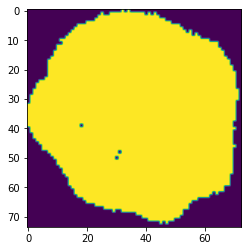

In [15]:
threshold = filters.threshold_otsu(dapi_nuclei[0].max(axis=0))
plt.imshow(dapi_nuclei[0].max(axis=0)>threshold)

In [16]:
dapi_masks = Parallel(n_jobs=15)(delayed(get_nucleus_mask_in_3d)(dapi_nuclei[i]) for i in tqdm_notebook(range(len(dapi_nuclei))))

<ipython-input-16-ceb4bb45dae8>:1: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  dapi_masks = Parallel(n_jobs=15)(delayed(get_nucleus_mask_in_3d)(dapi_nuclei[i]) for i in tqdm_notebook(range(len(dapi_nuclei))))


  0%|          | 0/108 [00:00<?, ?it/s]

In [17]:
explore_slices_2_samples([dapi_nuclei[8],dapi_masks[8]], cmap="seismic")

interactive(children=(IntSlider(value=8, description='plane', max=28), Output()), _dom_classes=('widget-intera…

<function src.utils.visualization.explore_slices_2_samples.<locals>.display_slice(plane=8)>

In [18]:
colored_segmentations = color_3d_segmentations(dapi_masks, dapi_nuclei)

In [19]:
def save_colored_images(colored_images, output_dir):
    os.makedirs(output_dir, exist_ok=True)
    for i in tqdm_notebook(range(len(colored_images))):
        filename = os.path.join(output_dir, "nuclei_{}.tif".format(i))
        tifffile.imsave(filename, colored_images[i])
        

In [20]:
output_dir = "./colored_dapi_segmentations/"
save_colored_images(colored_segmentations, output_dir)

<ipython-input-19-17467923a8e5>:3: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i in tqdm_notebook(range(len(colored_images))):


  0%|          | 0/108 [00:00<?, ?it/s]

In [21]:
explore_slices(colored_segmentations[8])

interactive(children=(IntSlider(value=8, description='plane', max=28), Output()), _dom_classes=('widget-intera…

<function src.utils.visualization.explore_slices.<locals>.display_slice(plane=8)>

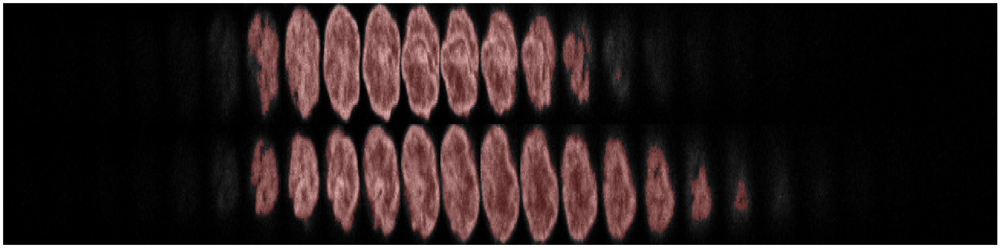

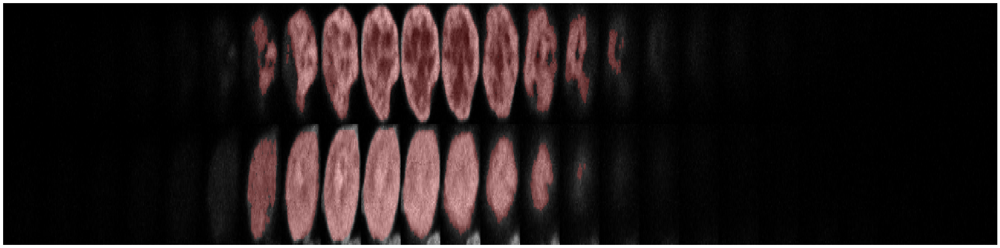

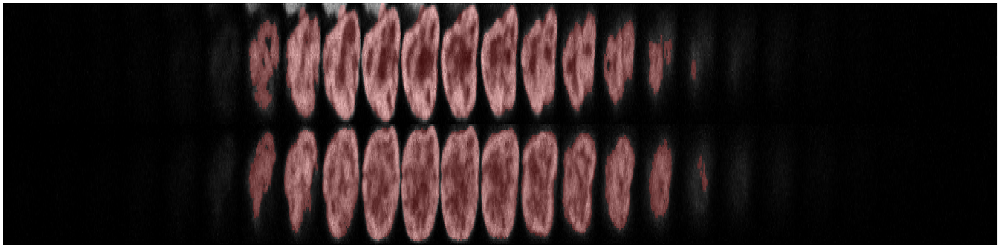

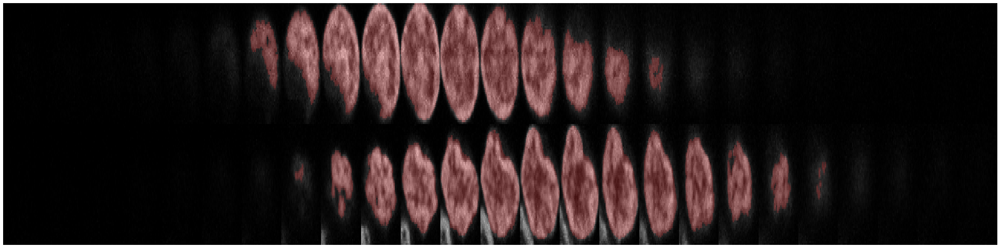

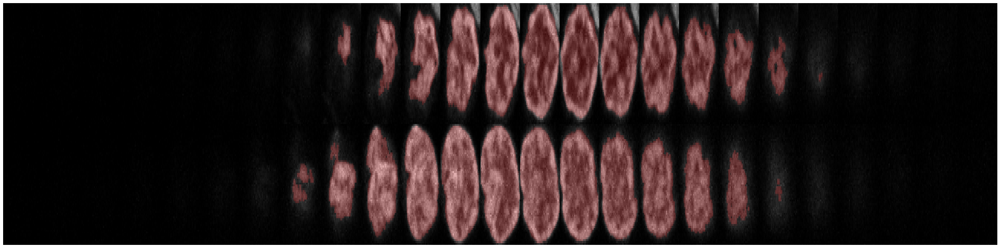

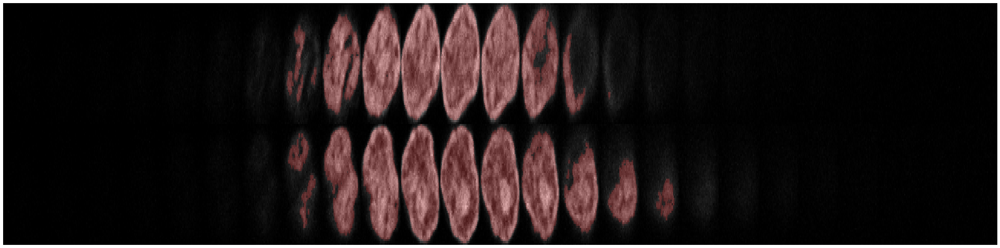

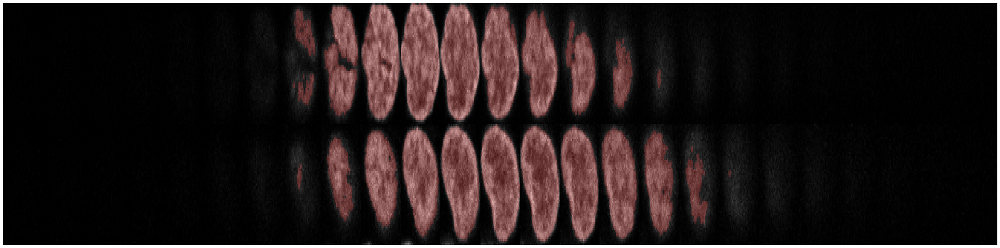

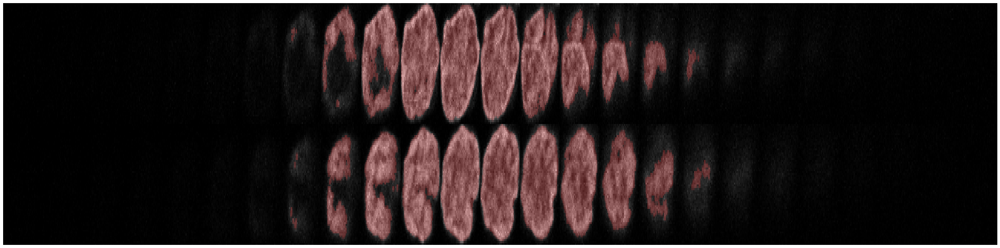

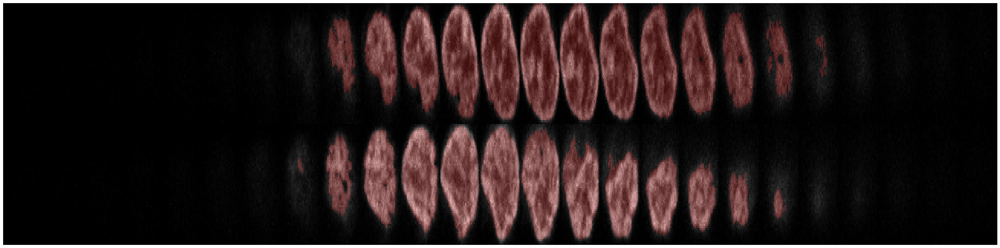

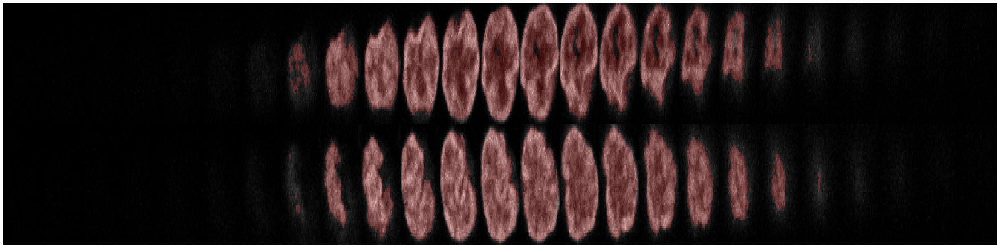

KeyboardInterrupt: 

In [45]:
plot_3d_images_as_map(colored_segmentations, max_depth=25, n_images_per_slide=2)

In [23]:
def get_nuclear_volume(nucleus_mask):
    return np.sum(nucleus_mask)

In [24]:
def get_nuclear_surface_area(nucleus_mask):
    verts, faces, _, _ = measure.marching_cubes(nucleus_mask, 0.0)
    surface_area = measure.mesh_surface_area(verts, faces)
    return surface_area

In [25]:
nuclear_volumes = []
nuclear_surface_areas = []
for i in tqdm_notebook(range(len(dapi_masks))):
    nuclear_volumes.append(get_nuclear_volume(dapi_masks[i]))
    nuclear_surface_areas.append(get_nuclear_surface_area(dapi_masks[i]))
nuclear_volumes = np.array(nuclear_volumes)
nuclear_surface_areas = np.array(nuclear_surface_areas)

<ipython-input-25-3fffb436a133>:3: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i in tqdm_notebook(range(len(dapi_masks))):


  0%|          | 0/108 [00:00<?, ?it/s]

In [26]:
features["nuclear_volume"] = nuclear_volumes[:len(features)]
features["nuclear_surface_area"] = nuclear_surface_areas[:len(features)]

### 2b. Features extracted from Lamin A/C

Next we derive images from Lamin A/C

In [27]:
lamin_nuclei = []
for nucleus in segmented_nuclei:
    lamin_nuclei.append(nucleus[:,2,:,:])

In [28]:
explore_slices_2_samples(lamin_nuclei)

interactive(children=(IntSlider(value=8, description='plane', max=25), Output()), _dom_classes=('widget-intera…

<function src.utils.visualization.explore_slices_2_samples.<locals>.display_slice(plane=8)>

In [29]:
def get_lamin_intensity(lamin_nucleus, nuclear_mask=None):
    if nuclear_mask is not None:
        lamin_intensity = np.sum(lamin_nucleus * nuclear_mask)
    else:
        lamin_intensity = np.sum(lamin_nucleus)
    return lamin_intensity

In [30]:
lamin_intensities = []
for i in tqdm_notebook(range(len(lamin_nuclei))):
    lamin_intensities.append(get_lamin_intensity(lamin_nuclei[i], dapi_masks[i]))
lamin_intensities = np.array(lamin_intensities)

<ipython-input-30-fae8a46c3e20>:2: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i in tqdm_notebook(range(len(lamin_nuclei))):


  0%|          | 0/108 [00:00<?, ?it/s]

In [31]:
features["lamin_intensity"] = lamin_intensities[:len(features)]

In [32]:
lamin_intensities/nuclear_volumes

array([  87.1870222 ,  232.78986158,  314.31079075,  200.79760432,
        213.34109794,  301.21069882,  431.53865337,  219.67315849,
        182.88937871,  460.20043621,  244.83822458,  141.83303675,
        359.46708955,   23.88339665,  208.0994865 ,  149.67222846,
        120.58562309,   74.88637106,  180.69063162,   52.92909065,
        312.51271767,   46.24357842,  138.90795607,  228.78292121,
         21.23496689,   54.2552649 ,  187.56293692,   44.2459703 ,
        194.31061093,  116.14153693,  120.56283313,   42.21007858,
         14.08432416,  581.52343723,  175.98180154,  226.45679803,
        127.62440805,   81.35376367,  208.87735782,   87.62500452,
        210.59092683,  296.23633885,  266.15936366,   38.05087298,
        366.29798243,  499.1213564 ,  500.36075587,   19.80995184,
         43.46854053,  142.80974469,  251.40560867,   22.67263588,
        172.41964286,   46.15379149,   11.37607259,  145.22744565,
         95.96168152,   21.1729769 ,  773.57436654,  130.32101

### 2c. Features extracted from HP1

In [33]:
hp1_nuclei = []
for nucleus in segmented_nuclei:
    hp1_nuclei.append(nucleus[:,1,:,:])

In [34]:
explore_slices_2_samples(hp1_nuclei, cmap="viridis")

interactive(children=(IntSlider(value=8, description='plane', max=25), Output()), _dom_classes=('widget-intera…

<function src.utils.visualization.explore_slices_2_samples.<locals>.display_slice(plane=8)>

In [35]:
def get_hc_mask(hp1_nucleus, nucleus_mask=None, k=0.4):
    threshold = np.min(hp1_nucleus) + k * (np.max(hp1_nucleus) - np.min(hp1_nucleus))
    binary = hp1_nucleus > threshold
    if nucleus_mask is not None:
        binary = np.uint8(binary) * np.uint8(nucleus_mask)
    return binary

In [36]:
hc_masks = []
for i in tqdm_notebook(range(len(hp1_nuclei))):
    hc_masks.append(get_hc_mask(hp1_nuclei[i], dapi_masks[i]))

<ipython-input-36-7d7c1f65f063>:2: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i in tqdm_notebook(range(len(hp1_nuclei))):


  0%|          | 0/108 [00:00<?, ?it/s]

In [37]:
colored_hc_segmentations = color_3d_segmentations(hc_masks, hp1_nuclei)

In [38]:
output_dir = "./colored_hp1_segmentations/"
save_colored_images(colored_hc_segmentations, output_dir)

<ipython-input-19-17467923a8e5>:3: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i in tqdm_notebook(range(len(colored_images))):


  0%|          | 0/108 [00:00<?, ?it/s]

In [39]:
explore_slices_2_samples(colored_hc_segmentations[0:])

interactive(children=(IntSlider(value=8, description='plane', max=25), Output()), _dom_classes=('widget-intera…

<function src.utils.visualization.explore_slices_2_samples.<locals>.display_slice(plane=8)>

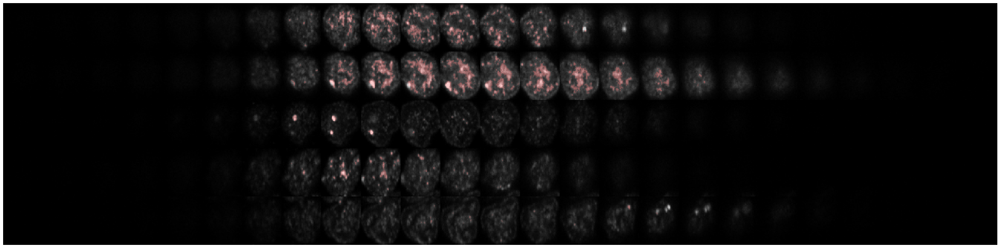

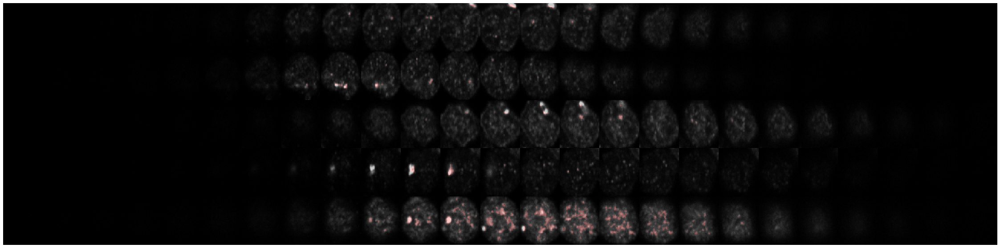

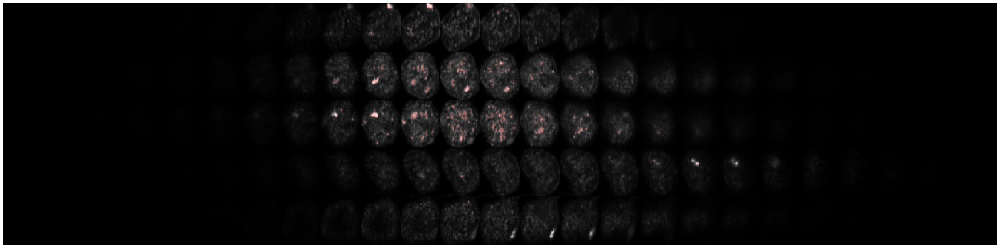

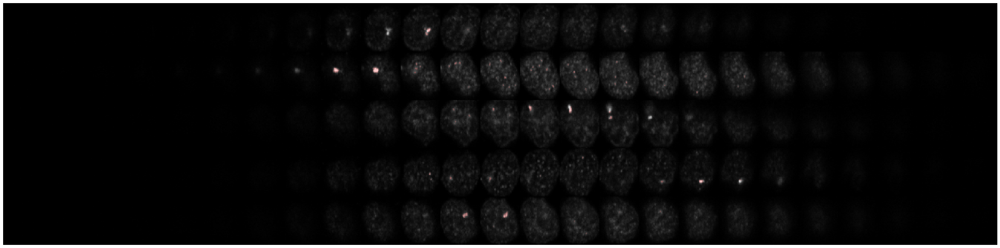

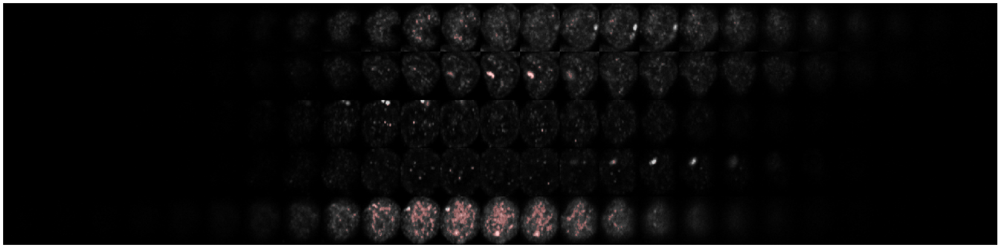

...

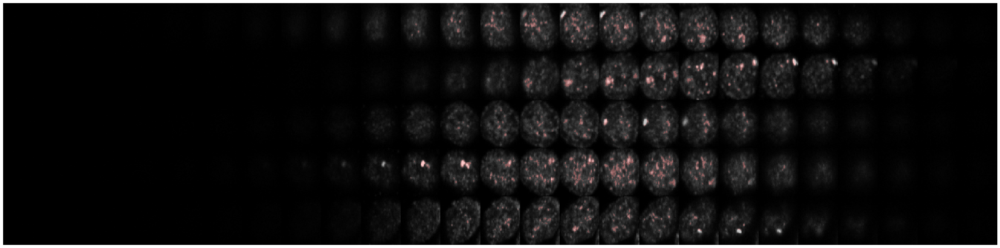

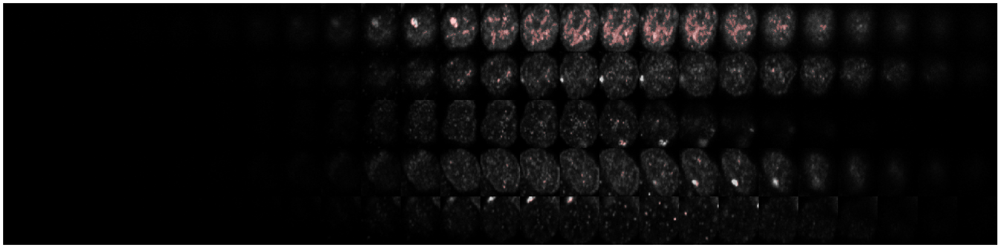

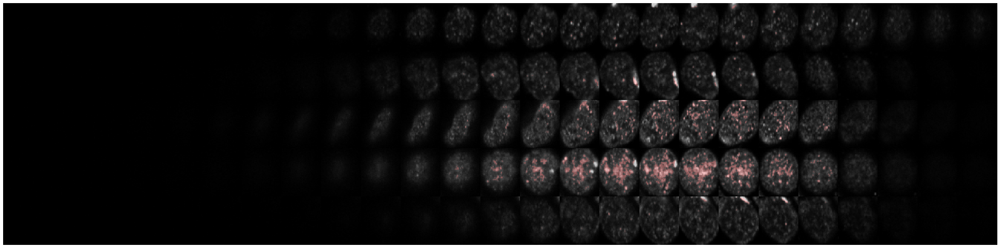

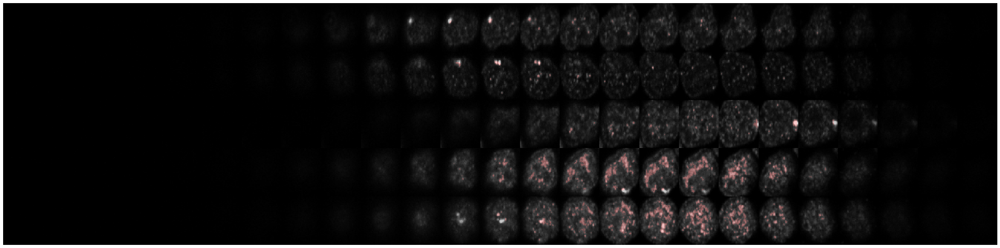

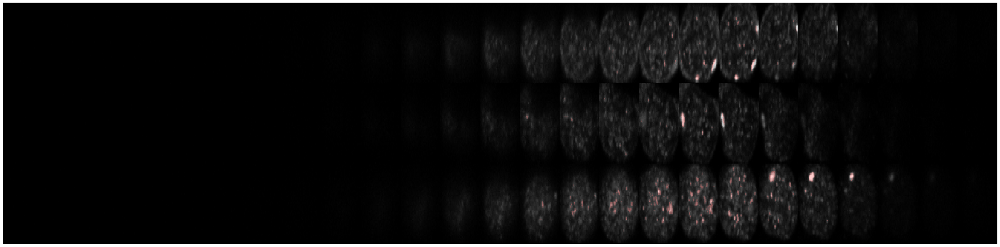

In [40]:
plot_3d_images_as_map(colored_hc_segmentations, max_depth=25)

In [41]:
def get_hc_volume(hc_mask):
    return np.sum(hc_mask)

In [42]:
hc_volumes = []
for i in tqdm_notebook(range(len(hc_masks))):
    hc_volumes.append(get_hc_volume(hc_masks[i]))
hc_volumes = np.array(hc_volumes)


<ipython-input-42-d48a27d3515e>:2: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i in tqdm_notebook(range(len(hc_masks))):


  0%|          | 0/108 [00:00<?, ?it/s]

In [43]:
hc_volumes/nuclear_volumes

array([0.10529231, 0.19139544, 0.00800906, 0.0248566 , 0.00256745,
       0.005139  , 0.00672561, 0.00701117, 0.00560316, 0.10132712,
       0.00869714, 0.03945841, 0.06533582, 0.0018996 , 0.00046381,
       0.00192524, 0.00846517, 0.00387882, 0.00254824, 0.00338995,
       0.00808995, 0.00890766, 0.00229122, 0.00122056, 0.1812362 ,
       0.00483444, 0.01050632, 0.00372298, 0.00032154, 0.        ,
       0.0003597 , 0.00244144, 0.00305741, 0.00596646, 0.00322226,
       0.00544697, 0.00390413, 0.00344128, 0.00469799, 0.00108558,
       0.00180896, 0.00214216, 0.00390734, 0.06818915, 0.00669623,
       0.05442651, 0.01826048, 0.00067491, 0.01780068, 0.0090508 ,
       0.00844487, 0.0539978 , 0.00974959, 0.00083605, 0.01605288,
       0.00590062, 0.00612166, 0.06141961, 0.23817469, 0.00263271,
       0.16611837, 0.01712655, 0.02216833, 0.00736159, 0.1371813 ,
       0.00520995, 0.01487317, 0.27152726, 0.04240756, 0.00186316,
       0.01766597, 0.00767072, 0.02943299, 0.29642666, 0.00579

In [80]:
def get_radial_distribution(image, object_mask, max_bins:int=32):
    g_r = []
    centroid = np.uint8(np.uint8(object_mask.shape) / 2)
    bins = int(min(min(image.shape), max_bins)/2)
    step_height = int(image.shape[0]/(2*bins))
    step_depth = int(image.shape[1]/(2*bins))
    step_width = int(image.shape[2]/(2*bins))
    print(centroid)
    masks = []
    
    for i in range(1,bins+1):
        g_r.append(image[centroid[0]-step_height:centroid[0]+step_height, 
                   centroid[1]-step_depth*i:centroid[1]+step_depth*i, 
                   centroid[2]-step_width*i:centroid[2]+step_width*i].sum())
        mask = np.zeros_like(image)
        mask[centroid[0] - step_height*i:centroid[0] + step_height*i,
        centroid[1] - step_depth*i:centroid[1] + step_depth*i,
        centroid[2] - step_width*i:centroid[2] + step_width*i] = 1
        masks.append(mask)
    return g_r, masks

In [113]:
def get_radial_profile_masks(mask, selem=None):
    convex_mask = morphology.convex_hull_image(mask)
    masks = [convex_mask]
    if selem is None:
        selem = np.zeros([11,11])
        selem[5,:] = 1
        selem[:,5] = 1
        selem_2 = np.zeros([11,11])
        selem_2[5,5] = 1
        selem = np.stack([selem_2,selem,selem_2], axis=0)
    for i in range(len(convex_mask)):
        masks.append(ndi.binary_erosion(masks[-1], selem))
    return masks

In [102]:
mask = dapi_masks[0]
masks = [morphology.convex_hull_image(mask)]
for i in range(len(mask)):
    m = np.zeros_like()
    for j in range(1,len(mask)):
        m 

In [81]:
gr, masks = get_radial_distribution(dapi_nuclei[0], dapi_masks[0])

[13 37 36]


In [108]:
        selem = np.zeros([11,11])
        selem[5,:] = 1
        selem[:,5] = 1
        selem_2 = np.zeros([11,11])
        selem_2[5,5] = 1
        selem = np.stack([selem_2,selem,selem_2], axis=0)

In [114]:
masks = get_radial_profile_masks(dapi_masks[0])

In [119]:
explore_slices_2_samples([masks[1], masks[4]])

interactive(children=(IntSlider(value=8, description='plane', max=25), Output()), _dom_classes=('widget-intera…

<function src.utils.visualization.explore_slices_2_samples.<locals>.display_slice(plane=8)>

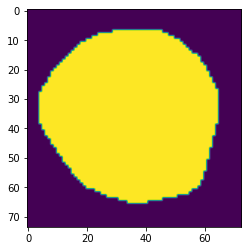

In [106]:
plt.imshow(morphology.binary_erosion(masks[2][11]))